In [ ]:
!pip install ipdb
!pip install numpy protobuf==3.16.0
!pip install onnx
!pip3 install -U pip && pip3 install onnx-simplifier
!python3 -m onnxsim input_onnx_model output_onnx_model
!pip install compressai

     |████████████████████████████████| 787 kB 5.4 MB/s 
     |████████████████████████████████| 370 kB 40.2 MB/s 
  Created wheel for ipdb: filename=ipdb-0.13.9-py3-none-any.whl size=11648 sha256=1a73f48e1dda0e4b03e54aa0ae17d57d01d6b4435f385aaf3d367f464bd04c88
  Stored in directory: /root/.cache/pip/wheels/65/cd/cc/aaf92acae337a28fdd2aa4d632196a59745c8c39f76eaeed01
Successfully built ipdb
  Attempting uninstall: prompt-toolkit
    Found existing installation: prompt-toolkit 1.0.18
    Uninstalling prompt-toolkit-1.0.18:
      Successfully uninstalled prompt-toolkit-1.0.18
  Attempting uninstall: ipython
    Found existing installation: ipython 5.5.0
    Uninstalling ipython-5.5.0:
      Successfully uninstalled ipython-5.5.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
jupyter-console 5.2.0 requires prompt-toolkit<2.0.0,>=1.0.0, but you have prompt-toolkit 

     |████████████████████████████████| 1.0 MB 5.5 MB/s 
  Attempting uninstall: protobuf
    Found existing installation: protobuf 3.17.3
    Uninstalling protobuf-3.17.3:
      Successfully uninstalled protobuf-3.17.3


     |████████████████████████████████| 12.3 MB 5.3 MB/s 
     |████████████████████████████████| 1.6 MB 5.3 MB/s 
  Attempting uninstall: pip
    Found existing installation: pip 21.1.3
    Uninstalling pip-21.1.3:
      Successfully uninstalled pip-21.1.3
     |████████████████████████████████| 466 kB 6.2 MB/s 
     |████████████████████████████████| 4.5 MB 35.5 MB/s 
  Created wheel for onnx-simplifier: filename=onnx_simplifier-0.3.6-py3-none-any.whl size=12873 sha256=181ef2395dd9e39ba09e4b640da4ee0ef3701a35fadfe2ca1bc9adb8893716b3
  Stored in directory: /root/.cache/pip/wheels/0c/47/80/8eb21098e22c19d60b1c14021ee67442b4ad2d7991fdad46ba
Successfully built onnx-simplifier
Simplifying...
Traceback (most recent call last):
  File "/usr/lib/python3.7/runpy.py", line 193, in _run_module_as_main
    "__main__", mod_spec)
  File "/usr/lib/python3.7/runpy.py", line 85, in _run_code
    exec(code, run_globals)
  File "/usr/local/lib/python3.7/dist-packages/onnxsim/__main__.py", line 90, in <

In [ ]:
!unzip onnx_exporter.zip

In [ ]:
!unzip Archive.zip

Archive:  Archive.zip
  inflating: __MACOSX/.___pycache__  
  inflating: __pycache__/network.cpython-38.pyc  
replace bw_agent.py? [y]es, [n]o, [A]ll, [N]one, [r]ename: A
  inflating: bw_agent.py             
  inflating: __MACOSX/._bw_agent.py  
  inflating: __MACOSX/._compressai_cp  
  inflating: compressai_cp/.DS_Store  
  inflating: __MACOSX/compressai_cp/._.DS_Store  
  inflating: __MACOSX/compressai_cp/._layers  
  inflating: __MACOSX/compressai_cp/._entropy_models  
  inflating: __MACOSX/compressai_cp/._datasets  
  inflating: compressai_cp/__init__.py  
  inflating: __MACOSX/compressai_cp/.___init__.py  
  inflating: __MACOSX/compressai_cp/._utils  
  inflating: __MACOSX/compressai_cp/._models  
  inflating: __MACOSX/compressai_cp/._zoo  
  inflating: __MACOSX/compressai_cp/._transforms  
  inflating: __MACOSX/compressai_cp/._ops  
  inflating: __MACOSX/compressai_cp/._cpp_exts  
  inflating: compressai_cp/layers/gdn.py  
  inflating: __MACOSX/compressai_cp/layers/._gdn.py  
  

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import network
import torch.optim as optim

import numpy as np
import numbers
from collections import Counter
from itertools import combinations
import math
import cv2
from numpy import linalg as LA
import statistics
from skimage.metrics import structural_similarity
import matplotlib.pyplot as plt
from PIL import Image
import seaborn as sns
import torchvision.transforms as transforms
import torchvision.models as models
from bw_agent import BWagent, ActorCell
from modules import GaussianSmoothing
import copy
from bw_agent import BWagent, ActorCell
from numpy import save
#from experiment_options import parser

def generate_ss_volume(x, sigma, kernel_size, M):
    B, C, H, W = x.size()
    out = [x]
    for i in range(M):
        kernel = GaussianSmoothing(C, kernel_size, (2**i) * sigma).to(x.device)
        out.append(kernel(x))
    out = torch.stack(out, dim=2)
    return out

def ss_warp(x, flo):
    """
    warp an scaled space volume (x) back to im1, according to scale space flow
    x: [B, C, D, H, W]
    flo: [B, 3, 1, H, W] ss flow
    """
    B, C, D, H, W = x.size()
    # mesh grid
    xx = torch.arange(0, W).view(1, -1).repeat(H, 1)
    yy = torch.arange(0, H).view(-1, 1).repeat(1, W)
    xx = xx.view(1, 1, H, W).repeat(B, 1, 1, 1)
    yy = yy.view(1, 1, H, W).repeat(B, 1, 1, 1)
    zz = torch.zeros_like(xx)
    grid = torch.cat((xx, yy, zz), 1).float()
    grid = grid.unsqueeze(2)
    if x.is_cuda:
        grid = grid.to(x.device)
    # vgrid = Variable(grid) + flo
    grid.requires_grad = True
    vgrid = grid + flo

    # scale grid to [-1,1]
    vgrid[:, 0, :, :, :] = 2.0 * vgrid[:, 0, :, :].clone() / max(W-1, 1) - 1.0
    vgrid[:, 1, :, :, :] = 2.0 * vgrid[:, 1, :, :].clone() / max(H-1, 1) - 1.0
    vgrid[:, 2, :, :, :] = 2.0 * vgrid[:, 2, :, :].clone() - 1.0

    vgrid = vgrid.permute(0, 2, 3, 4, 1)
    output = nn.functional.grid_sample(x, vgrid, align_corners=True)
    return output.squeeze(2)
    
class deep_jscc_source():
    """
    docstring for block deep_jscc_source
    """
    def __init__(self, video_file, model_dir, snr, packet_len):
        self.cout = 240
        self.num_chunks = 20
        self.chunk_size = self.cout // self.num_chunks
        self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
        self.snr = torch.tensor([[float(snr)]], requires_grad=True).cuda()
        self.packet_len = packet_len                                 # packet length = 48
        self.c_feat = 256
        self.max_memory = 300
        self.cout = 240
        self.pthfile = '/content/drive/MyDrive/typ_torch/v1.2.1_LOSSl2_SIG0.01,5_SNR0,20_COUT240_EPOCH296.pth'
        self.key_encoder = network.EncoderCell(c_in=3,
                                  c_feat=256,
                                  c_out=240,
                                  args=None).cuda(device = self.device)

        self.key_decoder = network.DecoderCell(c_in=240,
                                  c_feat=256,
                                  c_out=3,
                                  args=None).cuda(device = self.device)
        self.interp_encoder = network.InterpEncoderCell(c_in=21,
                                               c_feat=self.c_feat,
                                               c_out=self.cout,
                                               args=None).cuda(device = self.device)

        self.interp_decoder = network.InterpDecoderCell(c_in=self.cout,
                                               c_feat=self.c_feat,
                                               c_out=12,
                                               args=None).cuda(device = self.device)

        self.ssf_net = network.ScaledSpaceFlow(c_feat=self.c_feat).cuda(device = self.device)
        #self.args = parser.parse_args()
        #self.args.gpu = 0
        #self.args.num_chunks = 20
        #self.args.c_feat = 256
        #self.args.GoP = 5
        
        self.bw_agent = BWagent(max_memory_size=0, args=None,
                       actor_learning_rate=0)
        
        self.channel = network.Channel()
        self.cp = torch.load(self.pthfile)

        self.key_encoder.load_state_dict(self.cp['key_encoder'])
        self.key_decoder.load_state_dict(self.cp['key_decoder'])
        self.interp_encoder.load_state_dict(self.cp['interp_encoder'])
        self.interp_decoder.load_state_dict(self.cp['interp_decoder'])
        self.ssf_net.load_state_dict(self.cp['ssf_net'])
        self.bw_agent.load_state_dict(self.cp['bw_agent'])
        self.key_encoder.eval()
        self.key_decoder.eval()

        #self.bw_agent.eval()
        self.interp_encoder.eval()
        self.interp_decoder.eval()
        self.ssf_net.eval()
        self.ss_levels = 5
        self.ss_sigma = 0.01

        

        self.loader = transforms.Compose([
                                          transforms.ToTensor()])  # transform it into a torch tensor
        self.unloader = transforms.ToPILImage()  # reconvert into PIL image
        

    def to_tensor(self, image):
        frame_expand = self.loader(image).unsqueeze(0)
        frame = frame_expand.to(self.device, torch.float)
        return frame

    def to_numpy(self, tensor):
        frame = tensor.cpu().numpy()
        return frame
    
    def to_image(self,tensor):
        image = tensor.cpu().clone()  # we clone the tensor to not do changes on it
        image = image.squeeze(0)      # remove the fake batch dimension
        image = self.unloader(image)
        return image

    def quantative_measure(self, snr, frame, original, SNR_total, PSNR_total, SSIM_total):

        # Pil to cv2
        opencvOriginal = cv2.cvtColor(np.array(original), cv2.COLOR_RGB2BGR)
        opencvFrame = cv2.cvtColor(np.array(frame), cv2.COLOR_RGB2BGR)
        # PSNR calculation
        print(frame)
        PSNR = cv2.PSNR(opencvFrame, opencvOriginal)
        
        # SSIM calculation
        frameGray = cv2.cvtColor(opencvFrame, cv2.COLOR_BGR2GRAY)
        originalGray = cv2.cvtColor(opencvOriginal, cv2.COLOR_BGR2GRAY) 
        (SSIM, diff) = structural_similarity(frameGray, originalGray, full=True) 

        SNR_total.append(snr.item())
        PSNR_total.append(PSNR)
        SSIM_total.append(SSIM)
        return SNR_total, PSNR_total, SSIM_total
    
    def forward(self):
        image0 = Image.open("/content/frame_original0.png")
        image1 = Image.open("/content/frame_original1.png")
        image2 = Image.open("/content/frame_original2.png")
        image3 = Image.open("/content/frame_original3.png")
        image4 = Image.open("/content/frame_original4.png")
        # fake batch dimension required to fit network's input dimensions
        images = [image0, image1, image2, image3, image4]
        re_images = [None] * 5
        count = 0
        gops = []
        GoP = []
        frame = [None] * 5
        codes = [None] * 5

        interp_inputs = [None] * 5
        pred_GoP = [None] * 5

        for pic in images:
          gop = self.to_tensor(pic)
          gops.append(gop)
          GoP.append(gop)

        #print("frame is {}\n".format(frame))
        #print("gop is {}\n".format(gop))
        
        # Encode

        init_code = self.key_encoder(GoP[0], self.snr).detach()
        last_code = self.key_encoder(GoP[-1], self.snr).detach()

        interp_inputs[0] = GoP[0]
        interp_inputs[-1] = GoP[-1]
        for pred_idx in [2, 1, 3]:  # TODO: make this dynamic to GoP
            if pred_idx == 2:
                dist = 2
            else:
                dist = 1
            vol1 = generate_ss_volume(GoP[pred_idx - dist], self.ss_sigma, 3, self.ss_levels)
            vol2 = generate_ss_volume(GoP[pred_idx + dist], self.ss_sigma, 3, self.ss_levels)
            flow1 = self.ssf_net(torch.cat((GoP[pred_idx], GoP[pred_idx - dist]), dim=1)).detach()
            flow2 = self.ssf_net(torch.cat((GoP[pred_idx], GoP[pred_idx + dist]), dim=1)).detach()
            w1 = ss_warp(vol1, flow1.unsqueeze(2))
            w2 = ss_warp(vol2, flow2.unsqueeze(2))
            r1 = GoP[pred_idx] - w1
            r2 = GoP[pred_idx] - w2
            interp_input = torch.cat([GoP[pred_idx], w1, w2,
                                      r1, r2, flow1, flow2], dim=1)
            interp_inputs[pred_idx] = interp_input

        bw_state = torch.cat(interp_inputs, dim=1)
        bw_alloc, bw_policy = self.bw_agent.get_action(bw_state, self.snr, 'EXPERIMENT')

        bw_rec = bw_alloc
        bw_alloc = list(torch.chunk(bw_alloc, chunks=5, dim=1))

        print(len(interp_inputs))
        print(interp_inputs[-1].shape)
        #frame[0] = self.to_numpy(init_code)
        #frame[-1] = self.to_numpy(last_code)
        #i = 0
        # for element in codes:
        #   if i%2:
        #     element = element*1.05
        #   i = i+1
        # codes = torch.from_numpy(codes_all[0]).float().to(self.device)
        # codes2 = torch.from_numpy(codes_all[1]).float().to(self.device)

        init_ch_out = self.channel.awgn(init_code, self.snr.item())
        last_ch_out = self.channel.awgn(last_code, self.snr.item())
        # BW allocation
        alloc_last = bw_alloc[0]
        for b_idx in range(last_ch_out.size(0)):
            bw_last = alloc_last[b_idx].int().item()
            bw_last *= self.chunk_size
            last_ch_out[b_idx, bw_last:] = 0

        first_frame = self.key_decoder(init_ch_out, self.snr).detach()
        last_frame = self.key_decoder(last_ch_out, self.snr).detach()
        


        pred_GoP[0] = first_frame
        pred_GoP[-1] = last_frame

        for pred_idx in [2, 1, 3]:
            if pred_idx == 2:
                dist = 2
            else:
                dist = 1

            
            interp_input = interp_inputs[pred_idx]
            interp_encoder_out = self.interp_encoder(interp_input, self.snr).detach()
            ch_out = self.channel.awgn(interp_encoder_out, self.snr.item())
            interp_decoder_out = self.interp_decoder(ch_out, self.snr).detach()

            pred_bw = bw_alloc[pred_idx]
            for b_idx in range(ch_out.size(0)):
                batch_bw = pred_bw[b_idx].int().item()
                batch_bw *= self.chunk_size
                ch_out[b_idx, batch_bw:] = 0

            f1, f2, a, r = torch.split(interp_decoder_out,
                                        split_size_or_sections=[3, 3, 3, 3],
                                        dim=1)

            a = F.softmax(a, dim=1)
            a1, a2, a3 = torch.chunk(a, chunks=3, dim=1)
            r = torch.sigmoid(r)

            a1 = a1.repeat_interleave(3, dim=1)
            a2 = a2.repeat_interleave(3, dim=1)
            a3 = a3.repeat_interleave(3, dim=1)

            pred_vol1 = generate_ss_volume(pred_GoP[pred_idx - dist], self.ss_sigma, 3, self.ss_levels)
            pred_vol2 = generate_ss_volume(pred_GoP[pred_idx + dist], self.ss_sigma, 3, self.ss_levels)
            pred_1 = ss_warp(pred_vol1, f1.unsqueeze(2))
            pred_2 = ss_warp(pred_vol2, f2.unsqueeze(2))

            pred = a1 * pred_1 + a2 * pred_2 + a3 * r
            pred_GoP[pred_idx] = pred

        plt.ion()
        plt.figure()
        #self.imshow(last_frame)

        for i, prediction in enumerate(pred_GoP):
            re_images[i] = self.to_image(pred_GoP[i])

        SNR_total = []
        PSNR_total = []
        SSIM_total = []
        for i in range(5):
            SNR_total, PSNR_total, SSIM_total = self.quantative_measure(self.snr, re_images[i], images[i], SNR_total, PSNR_total, SSIM_total)


        # ax = []
        # fig = plt.figure(figsize=(24*2/3, 32/3*2))
        # for i in range(5):
        #   ax.append( fig.add_subplot(1, 5, i+1) )
        #   plt.imshow(re_images[i])
        #   if self.snr.item() < 1.0:
        #       ax[-1].set_title("Frame: %1.0f\n"%(i+1) + "channel SNR:%1.0f\n "%self.snr.item() + "PSNR:%1.2f, "%PSNR_total[i] + "SSIM:%1.3f "%SSIM_total[i] )  # set title
        #   else:
        #       ax[-1].set_title("channel SNR:%1.0f\n "%self.snr.item() + "PSNR:%1.2f, "%PSNR_total[i] + "SSIM:%1.3f "%SSIM_total[i] )  # set title
        #   #plt.pause(0.01) # pause a bit so that plots are updated
        #   plt.axis('off')
        # fig.tight_layout() 



        return (PSNR_total[2], SSIM_total[2])
        
        # psnr = 0.0
        # ssim = 0.0
        # for i, quality in enumerate(PSNR_total):
        #     psnr = psnr + quality

        # for i, quality in enumerate(SSIM_total):
        #     ssim = ssim + quality

        # psnr = psnr/5.0
        # ssim = ssim/5.0

        # return (psnr, ssim)

    def work(self):
        (PSNR, SSIM) = self.forward()       
        return (PSNR, SSIM)
        #self.forward()

tensor([[20,  0,  0,  0],
        [19,  1,  0,  0],
        [19,  0,  1,  0],
        ...,
        [ 0,  0,  2, 18],
        [ 0,  0,  1, 19],
        [ 0,  0,  0, 20]])
Action set size: 1771
Actor Policy
5
torch.Size([1, 3, 240, 320])
<PIL.Image.Image image mode=RGB size=320x240 at 0x7FEC4195BD50>
<PIL.Image.Image image mode=RGB size=320x240 at 0x7FEC4195BE90>
<PIL.Image.Image image mode=RGB size=320x240 at 0x7FEC4195B150>
<PIL.Image.Image image mode=RGB size=320x240 at 0x7FEC4195B2D0>
<PIL.Image.Image image mode=RGB size=320x240 at 0x7FEC4195B310>


<Figure size 432x288 with 0 Axes>

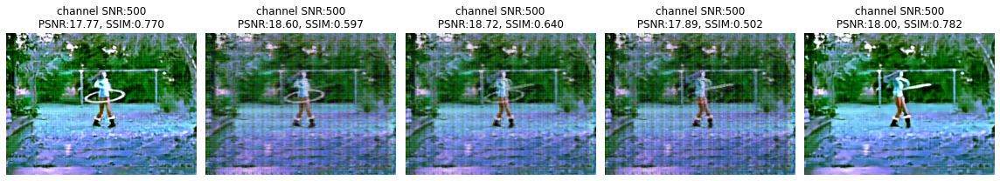

In [ ]:
#Special test
source = deep_jscc_source('/content/v_HulaHoop_g13_c03.avi',
                              '/home/xaviernx/onnx_output', 500 , 96)
(PSNR, SSIM) = source.work()

tensor([[20,  0,  0,  0],
        [19,  1,  0,  0],
        [19,  0,  1,  0],
        ...,
        [ 0,  0,  2, 18],
        [ 0,  0,  1, 19],
        [ 0,  0,  0, 20]])
Action set size: 1771
Actor Policy
5
torch.Size([1, 3, 240, 320])
<PIL.Image.Image image mode=RGB size=320x240 at 0x7FEC44772850>
<PIL.Image.Image image mode=RGB size=320x240 at 0x7FEC44772B50>
<PIL.Image.Image image mode=RGB size=320x240 at 0x7FEC447725D0>
<PIL.Image.Image image mode=RGB size=320x240 at 0x7FEC44772D90>
<PIL.Image.Image image mode=RGB size=320x240 at 0x7FEC44772CD0>
29.115948862228095
0.8900168509803377
tensor([[20,  0,  0,  0],
        [19,  1,  0,  0],
        [19,  0,  1,  0],
        ...,
        [ 0,  0,  2, 18],
        [ 0,  0,  1, 19],
        [ 0,  0,  0, 20]])
Action set size: 1771
Actor Policy
5
torch.Size([1, 3, 240, 320])
<PIL.Image.Image image mode=RGB size=320x240 at 0x7FEC4EF40F10>
<PIL.Image.Image image mode=RGB size=320x240 at 0x7FEC4EF40F50>
<PIL.Image.Image image mode=RGB size=320x2

<Figure size 432x288 with 0 Axes>

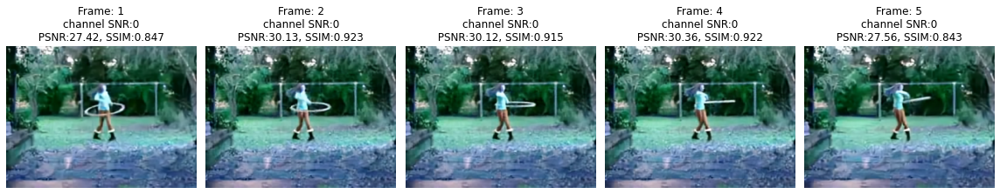

<Figure size 432x288 with 0 Axes>

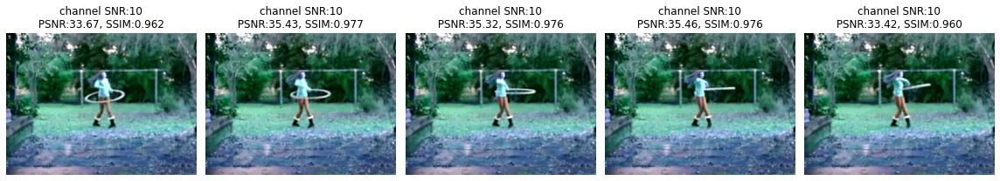

<Figure size 432x288 with 0 Axes>

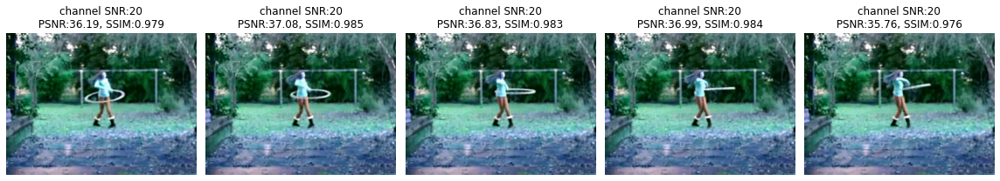

<Figure size 432x288 with 0 Axes>

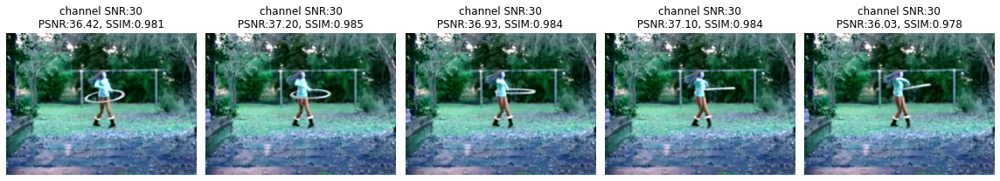

In [ ]:
for snr in range(0, 40, 10):
    source = deep_jscc_source('/content/v_HulaHoop_g13_c03.avi',
                              '/home/xaviernx/onnx_output', snr , 96)
    (PSNR, SSIM) = source.work()
    print(PSNR)
    print(SSIM)

In [ ]:
PSNRs = []
SNRs = []
SSIMs = []
for snr in range(30):
    source = deep_jscc_source('/content/v_HulaHoop_g13_c03.avi',
                              '/home/xaviernx/onnx_output', snr , 96)
    (PSNR, SSIM) = source.work()
    SSIMs.append(SSIM)
    PSNRs.append(PSNR)
    SNRs.append(snr)

tensor([[20,  0,  0,  0],
        [19,  1,  0,  0],
        [19,  0,  1,  0],
        ...,
        [ 0,  0,  2, 18],
        [ 0,  0,  1, 19],
        [ 0,  0,  0, 20]])
Action set size: 1771
Actor Policy
5
torch.Size([1, 3, 240, 320])
<PIL.Image.Image image mode=RGB size=320x240 at 0x7FEC40813F50>
<PIL.Image.Image image mode=RGB size=320x240 at 0x7FEC2E5AAC10>
<PIL.Image.Image image mode=RGB size=320x240 at 0x7FEC2E5AA510>
<PIL.Image.Image image mode=RGB size=320x240 at 0x7FEC2E5AA750>
<PIL.Image.Image image mode=RGB size=320x240 at 0x7FEC2E5AA710>
tensor([[20,  0,  0,  0],
        [19,  1,  0,  0],
        [19,  0,  1,  0],
        ...,
        [ 0,  0,  2, 18],
        [ 0,  0,  1, 19],
        [ 0,  0,  0, 20]])
Action set size: 1771
Actor Policy
5
torch.Size([1, 3, 240, 320])
<PIL.Image.Image image mode=RGB size=320x240 at 0x7FEC2F2BF250>
<PIL.Image.Image image mode=RGB size=320x240 at 0x7FEC2F2BFC10>
<PIL.Image.Image image mode=RGB size=320x240 at 0x7FEC441410D0>
<PIL.Image.Image

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:294: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<PIL.Image.Image image mode=RGB size=320x240 at 0x7FEC40E80B10>
<PIL.Image.Image image mode=RGB size=320x240 at 0x7FEC40E807D0>
<PIL.Image.Image image mode=RGB size=320x240 at 0x7FEC40E804D0>
<PIL.Image.Image image mode=RGB size=320x240 at 0x7FEC40E80310>
<PIL.Image.Image image mode=RGB size=320x240 at 0x7FEC40E801D0>
tensor([[20,  0,  0,  0],
        [19,  1,  0,  0],
        [19,  0,  1,  0],
        ...,
        [ 0,  0,  2, 18],
        [ 0,  0,  1, 19],
        [ 0,  0,  0, 20]])
Action set size: 1771
Actor Policy
5
torch.Size([1, 3, 240, 320])
<PIL.Image.Image image mode=RGB size=320x240 at 0x7FEC410EE650>
<PIL.Image.Image image mode=RGB size=320x240 at 0x7FEC410EEC50>
<PIL.Image.Image image mode=RGB size=320x240 at 0x7FEC410EE410>
<PIL.Image.Image image mode=RGB size=320x240 at 0x7FEC410EEAD0>
<PIL.Image.Image image mode=RGB size=320x240 at 0x7FEC410EEFD0>
tensor([[20,  0,  0,  0],
        [19,  1,  0,  0],
        [19,  0,  1,  0],
        ...,
        [ 0,  0,  2, 18],
       

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

In [ ]:
PSNRs1 = PSNRs
SSIMs1 = SSIMs

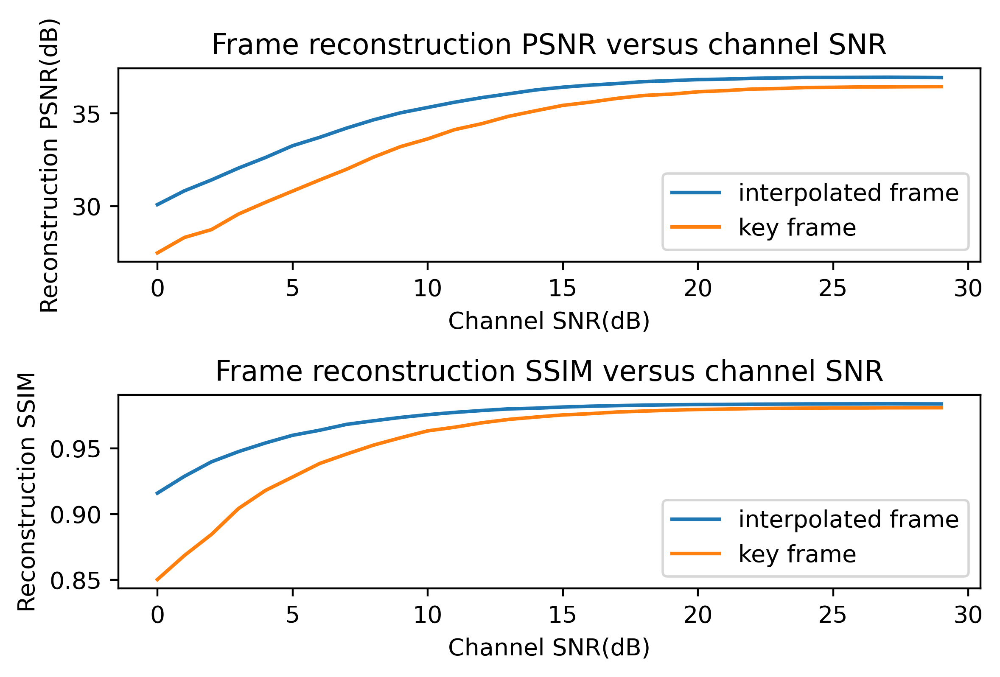

211.83115457683175
5.832518128591497


In [ ]:
fig = plt.figure(dpi=400)
ax1 = fig.add_subplot(211)
ax2 = fig.add_subplot(212)

ax1.plot(SNRs, PSNRs, label="interpolated frame")
ax1.plot(SNRs, PSNRs1, label="key frame")
ax2.plot(SNRs, SSIMs, label="interpolated frame")
ax2.plot(SNRs, SSIMs1, label="key frame")

ax1.title.set_text('Frame reconstruction PSNR versus channel SNR')
ax2.title.set_text('Frame reconstruction SSIM versus channel SNR')
ax1.set_xlabel('Channel SNR(dB)')
ax1.set_ylabel('Reconstruction PSNR(dB)')
ax2.set_xlabel('Channel SNR(dB)')
ax2.set_ylabel('Reconstruction SSIM')
ax1.legend(loc="lower right")
ax2.legend(loc="lower right")
fig.tight_layout() 
plt.show()
psnr = 0.0
ssim = 0.0
for i, quality in enumerate(PSNRs):
    psnr = psnr + quality

for i, quality in enumerate(SSIMs):
    ssim = ssim + quality

psnr = psnr/5.0
ssim = ssim/5.0

print(psnr)
print(ssim)

In [ ]:
rmimport torch
import torch.nn as nn
import torch.nn.functional as F
import network
import torch.optim as optim

import numpy as np
import numbers
from collections import Counter
from itertools import combinations
import math
import cv2
from numpy import linalg as LA
import statistics
from skimage.metrics import structural_similarity
import matplotlib.pyplot as plt
from PIL import Image
import seaborn as sns
import torchvision.transforms as transforms
import torchvision.models as models
#from __future__ import print_function


import copy
     		     # channel snr, should be estimated

def forward(snr, SNR_total, PSNR_total, SSIM_total):
    snr = torch.tensor([[float(snr)]], requires_grad=True).cuda()

    pthfile = '/content/drive/MyDrive/typ_torch/v1.2.1_LOSSl2_SIG0.01,5_SNR0,20_COUT240_EPOCH296.pth'
    key_encoder = network.EncoderCell(c_in=3,
                                      c_feat=256,
                                      c_out=240,
                                      args=None).cuda(device = 0)

    key_decoder = network.DecoderCell(c_in=240,
                                      c_feat=256,
                                      c_out=3,
                                      args=None).cuda(device = 0)

    cp = torch.load(pthfile)

    key_encoder.load_state_dict(cp['key_encoder'])
    key_decoder.load_state_dict(cp['key_decoder'])
    key_encoder.eval()
    key_decoder.eval()
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    channel = network.Channel()
    loader = transforms.Compose([transforms.ToTensor()])  # transform it into a torch tensor
    unloader = transforms.ToPILImage()  # reconvert into PIL image

    def imshow(tensor):
        image = tensor.cpu().clone()  # we clone the tensor to not do changes on it
        image = image.squeeze(0)      # remove the fake batch dimension
        image = unloader(image)
        #plt.imshow(image)
        #plt.pause(0.01) # pause a bit so that plots are updated
        return(image)

    def image_loader(image_name):
        image = Image.open(image_name)
        # fake batch dimension required to fit network's input dimensions
        image = loader(image).unsqueeze(0)
        print(image.shape)               #(1,3,240,320)
        return image.to(device, torch.float)

    def quantative_measure(snr, frame, original, SNR_total, PSNR_total, SSIM_total):
        original = original.cpu().clone()  # we clone the tensor to not do changes on it
        original = original.squeeze(0)      # remove the fake batch dimension
        original = unloader(original)

        frame = frame.cpu().clone()  # we clone the tensor to not do changes on it
        frame = frame.squeeze(0)      # remove the fake batch dimension
        frame = unloader(frame)

        # Pil to cv2
        opencvOriginal = cv2.cvtColor(np.array(original), cv2.COLOR_RGB2BGR)
        opencvFrame = cv2.cvtColor(np.array(frame), cv2.COLOR_RGB2BGR)
        # PSNR calculation
        print(frame)
        PSNR = cv2.PSNR(opencvFrame, opencvOriginal)
        
        # SSIM calculation
        frameGray = cv2.cvtColor(opencvFrame, cv2.COLOR_BGR2GRAY)
        originalGray = cv2.cvtColor(opencvOriginal, cv2.COLOR_BGR2GRAY) 
        (SSIM, diff) = structural_similarity(frameGray, originalGray, full=True) 

        SNR_total.append(snr.item())
        PSNR_total.append(PSNR)
        SSIM_total.append(SSIM)
        return SNR_total, PSNR_total, SSIM_total

    image_file = "/content/frame_original.png"
    image = image_loader(image_file)

    # gop = frame / 255.0  
    # print("gop is {}\n".format(gop))
    # print("frame is {}\n".format(image))

    code = key_encoder(image, snr).detach()
    code = channel.awgn(code, snr.item())
    code = code.cpu().numpy()
    i = 0
    for element in code:
      if i%2:
        element = element*1.05
      i = i+1
    code = torch.from_numpy(code).float().to(device)
    image_reconstruction = key_decoder(code, snr).detach()
    # Quantative calculation 
    SNR_total, PSNR_total, SSIM_total = quantative_measure(snr, image_reconstruction, image, SNR_total, PSNR_total, SSIM_total)

    # print(type(last_frame))

    #plt.figure()
    image_reconstruction = imshow(image_reconstruction)
    return image_reconstruction



torch.Size([1, 3, 240, 320])
<PIL.Image.Image image mode=RGB size=320x240 at 0x7EFE17497E90>
torch.Size([1, 3, 240, 320])
<PIL.Image.Image image mode=RGB size=320x240 at 0x7EFE173A1F50>
torch.Size([1, 3, 240, 320])
<PIL.Image.Image image mode=RGB size=320x240 at 0x7EFE17468E50>
torch.Size([1, 3, 240, 320])
<PIL.Image.Image image mode=RGB size=320x240 at 0x7EFE1750AED0>
torch.Size([1, 3, 240, 320])
<PIL.Image.Image image mode=RGB size=320x240 at 0x7EFE1752BE50>
torch.Size([1, 3, 240, 320])
<PIL.Image.Image image mode=RGB size=320x240 at 0x7EFE17582C90>
torch.Size([1, 3, 240, 320])
<PIL.Image.Image image mode=RGB size=320x240 at 0x7EFE17510650>
torch.Size([1, 3, 240, 320])
<PIL.Image.Image image mode=RGB size=320x240 at 0x7EFE17482B50>
torch.Size([1, 3, 240, 320])
<PIL.Image.Image image mode=RGB size=320x240 at 0x7EFE17587F90>
torch.Size([1, 3, 240, 320])
<PIL.Image.Image image mode=RGB size=320x240 at 0x7EFE175D5D90>
torch.Size([1, 3, 240, 320])
<PIL.Image.Image image mode=RGB size=320x

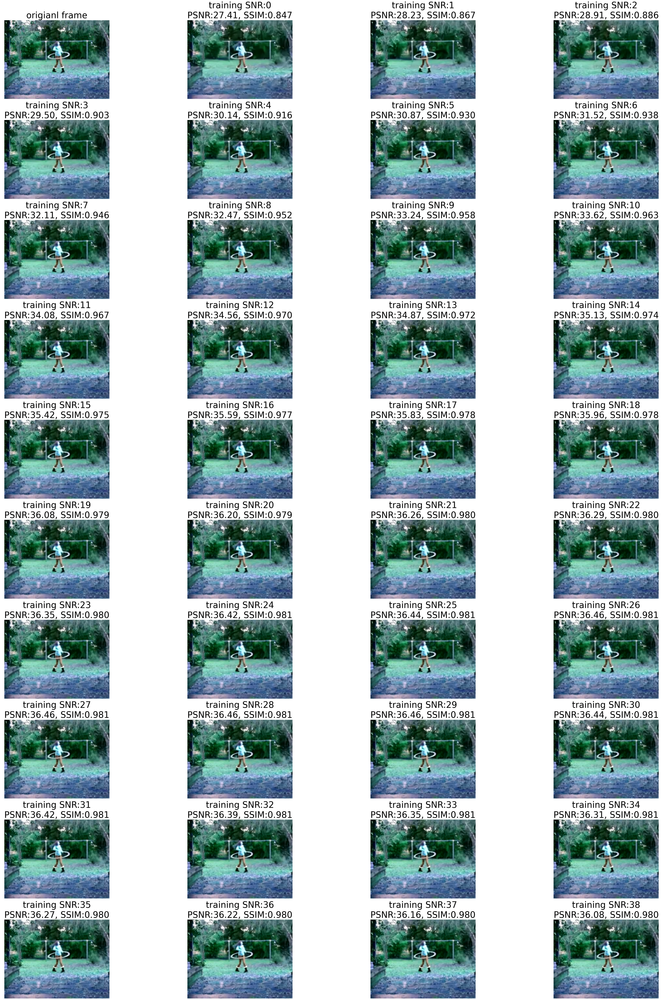

In [ ]:
plt.ion()
SSIM_total = [0]
PSNR_total = [0]
SNR_total = [0]

rows = 10
columns = 4
ax = []
i = 1
fig = plt.figure(figsize=(24*2, 32*2))

image_file = "/content/frame_original.png"
original = Image.open(image_file)
ax.append( fig.add_subplot(rows, columns, 1) )
ax[-1].set_title("origianl frame", fontsize=40)  # set title
plt.imshow(original)
plt.axis('off')

for snr in range(0, 39, 1):
  image = forward(snr, SNR_total, PSNR_total, SSIM_total)
  # create subplot and append to ax
  ax.append( fig.add_subplot(rows, columns, i+1) )
  ax[-1].set_title("training SNR:%1.0f\n "%snr + "PSNR:%1.2f, "%PSNR_total[i] + "SSIM:%1.3f "%SSIM_total[i], fontsize=40)  # set title
  plt.imshow(image)
  plt.axis('off')

  i += 1
fig.tight_layout() 
plt.show()

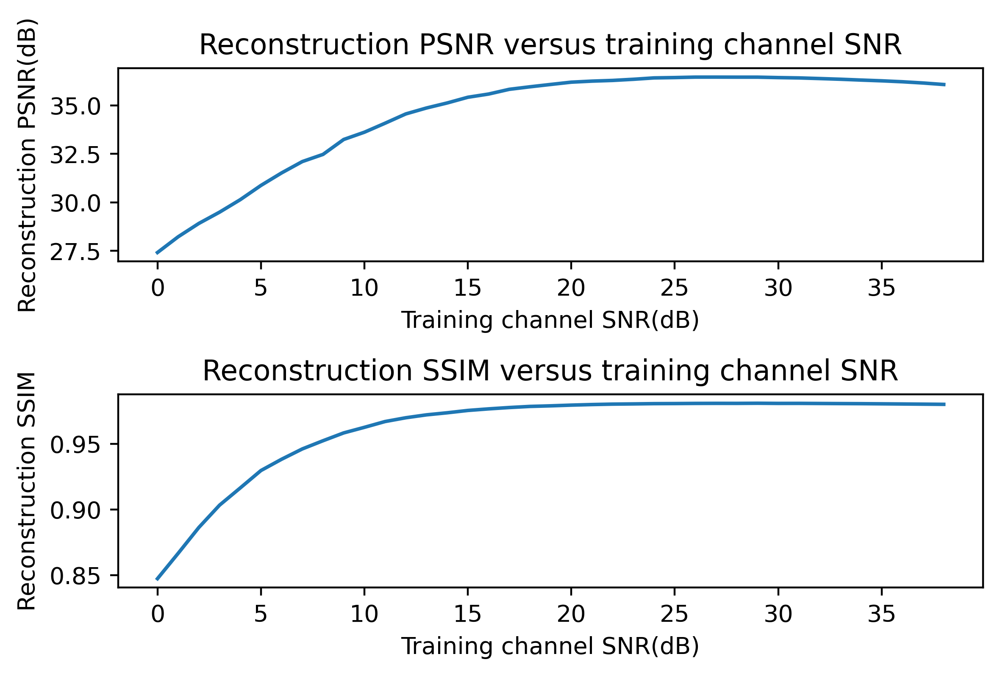

In [ ]:
fig = plt.figure(dpi=400)
ax1 = fig.add_subplot(211)
ax2 = fig.add_subplot(212)
ax1.plot(SNR_total[1:], PSNR_total[1:])
ax1.plot(SNR_total[1:], PSNR_total[1:])
ax2.plot(SNR_total[1:], SSIM_total[1:])
ax2.plot(SNR_total[1:], SSIM_total[1:])

ax1.title.set_text('Reconstruction PSNR versus training channel SNR')
ax2.title.set_text('Reconstruction SSIM versus training channel SNR')
ax1.set_xlabel('Training channel SNR(dB)')
ax1.set_ylabel('Reconstruction PSNR(dB)')
ax2.set_xlabel('Training channel SNR(dB)')
ax2.set_ylabel('Reconstruction SSIM')
fig.tight_layout() 
plt.show()